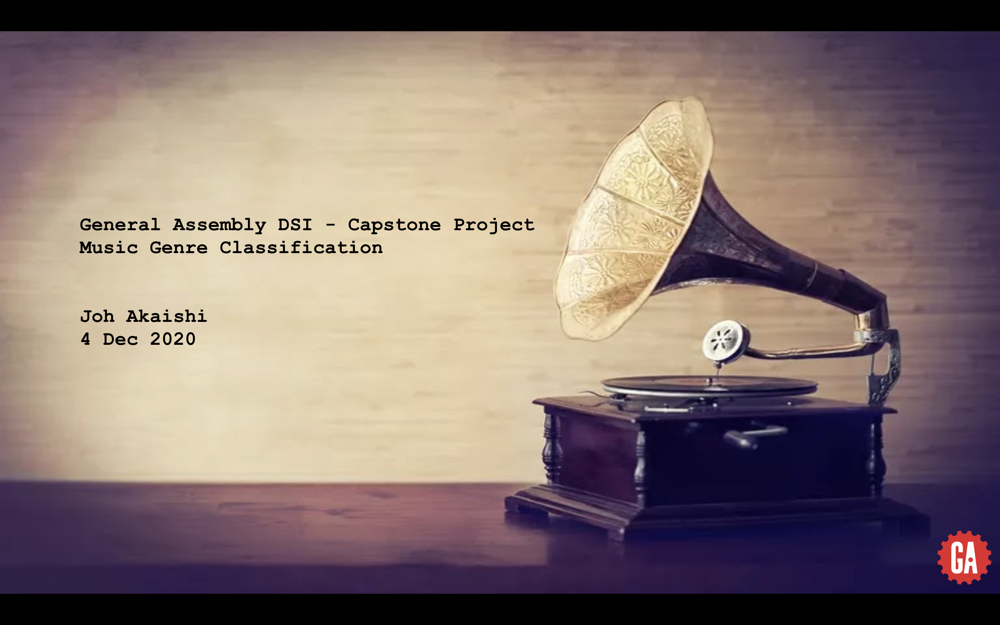

<a id='back_to_top'></a>

# Music Genre Classification
##### Joh Akaishi<br>General Assembly Data Science Immersive Capstone<br>December 2020

This repository contains notebooks for my capstone projected for General Assembly's Data Science Immersive.<br>
Full presentation slides can be found [here](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/GTZAN_final_presentation_2.pdf).

## Table of Contents
---
[1. Problem Statement](#problem_statement)<br>
[2. EDA & Preprocessing](#eda_preprocessing)<br>
[3. Modelling on Audio Features](#modelling_audio)<br>
[4. Modelling on Mel Spectrograms](#modelling_spectrograms)<br>
[5. Conclusions & Future Expansion](#conclusions)

<a id='problem_statement'></a>

## 1. Problem Statement
---
This project will attempt at correctly classifying a track between 10 different genres of music:
- Rock
- Reggae
- Classical
- Hip-hop
- Blues
- Metal
- Pop
- Country
- Disco
- Jazz

The GTZAN dataset was used for this classification study, as referenced in "[Musical Genre Classification of Audio Signals](https://www.researchgate.net/publication/3333877_Musical_Genre_Classification_of_Audio_Signals)" by George Tzanetakis and Perry Cook, in IEEE Transactions on Speech and Audio Processing, Vol. 10, No. 5, July 2002. The dataset can be downloaded [here](http://marsyas.info/downloads/datasets.html).

I approached this classification problem from two independent angles, using:
1. Audio Signal Features
2. Mel Spectrograms

#### 1. Audio Signal Features
- The GTZAN dataset consists of 9990 observations (different tracks) with 60 different columns:

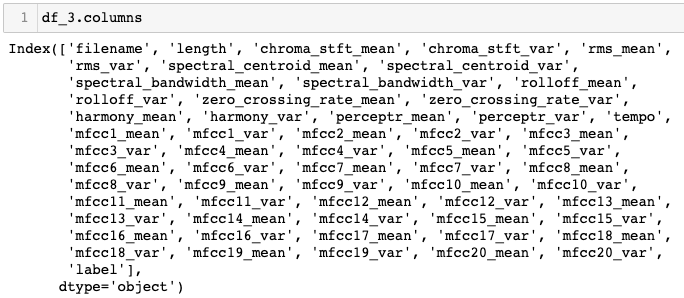

- **filename**: name of the file (eg 'blues.00000.0.wav', 'hiphop.00045.3.wav', 'rock.00016.4.wav', etc)
- **length**: length of each track observation, given in sample number. All observations are the same value of 66149 samples; at a sample rate of 22050 Hz, this amounts to approx 3 second audio samples.
- **label**: the genre of the track observation ('blues', 'hiphop', 'rock', 'classical', etc). 10 unique labels for the 10 different genres.<br>
etc...
<br>
- Information for other features given within the [data dictionary](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/data_dictionary.ipynb).

#### 2. Mel Spectrograms
Mel spectrograms are a representation of the power spectrum of an audio signal, according to frequency.<br>
Below is an example of such a spectrogram for 'blues.00001.wav'.<br>
Frequency (Hz) on the y axis, against Time (s) on the x axis. 
Please note that for the spectrograms I used longer audio samples of 30 seconds each (instead of 3 seconds, as was the case for the 'audio signal features' above).

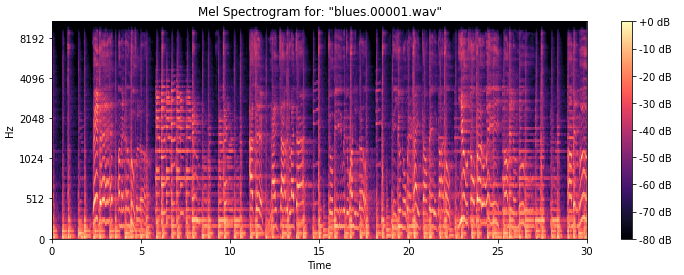

[(back to top)](#back_to_top)

<a id='eda_preprocessing'></a>

## 2. EDA & Preprocessing 
---
[Link to notebook](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_1_eda.ipynb)

[Data dictionary](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/data_dictionary.ipynb)

Upon closer observation of the dataset, some of the rows were found to be duplicated. All of the features had identical values, but with different filenames. In the case of some, these were also split across different genres ('rock' and 'metal' below).

After dropping duplicated rows, the original dataset shape was reduced from 9990 rows x 60 cols, to 9847 rows x 60 cols.

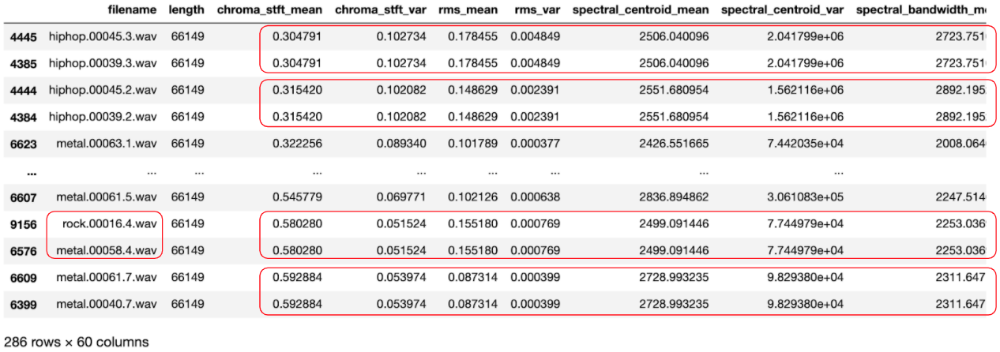

After dropping duplicate rows, columns 'filename' and 'length' were dropped.

---

Having run a pairplot for all given features, below are a selection of a few feature planes that show some interesting distributions and relationships across the different genres.
    

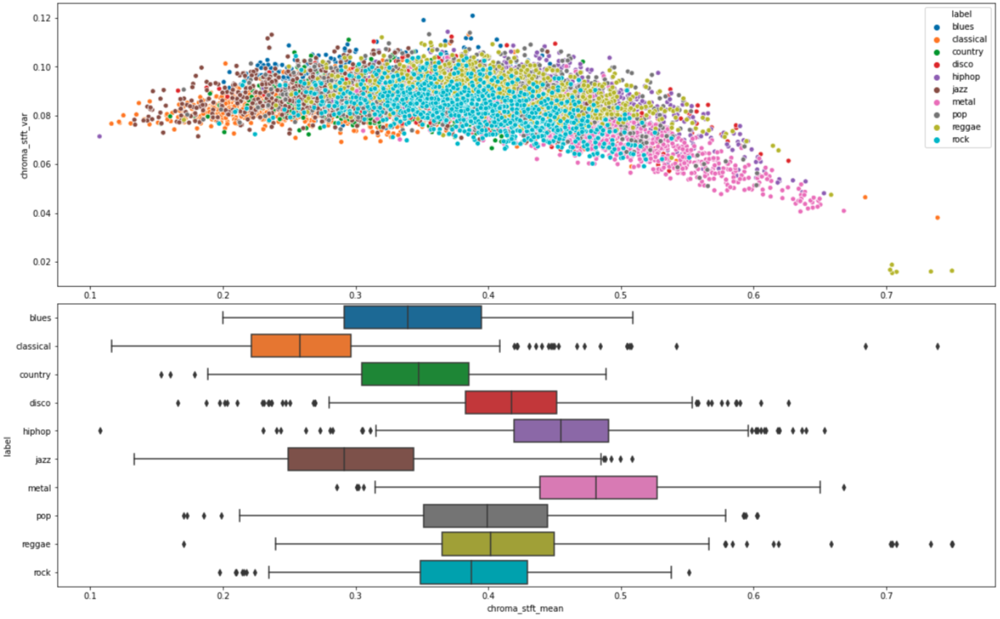

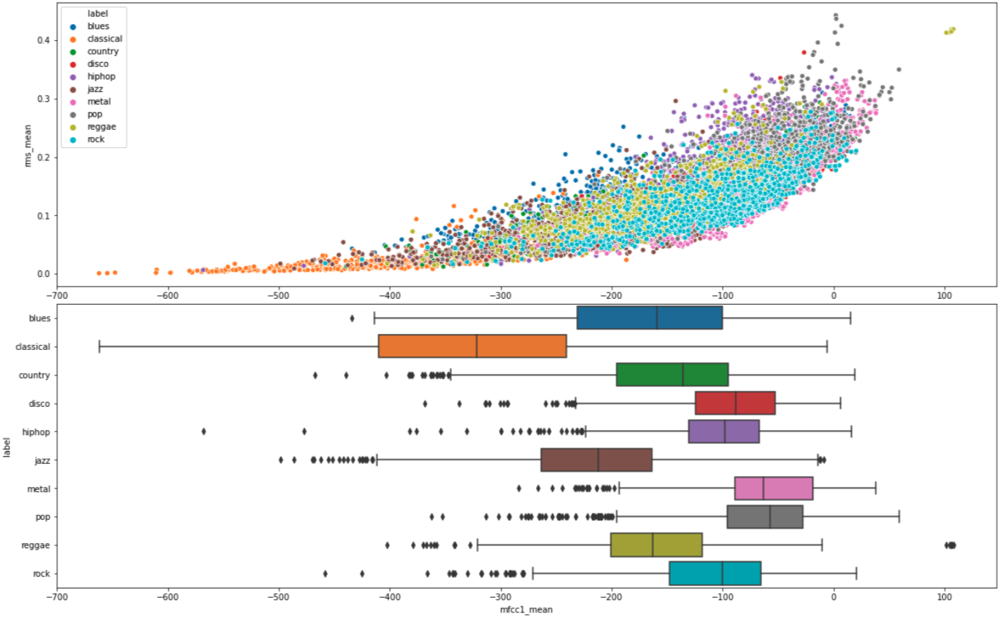

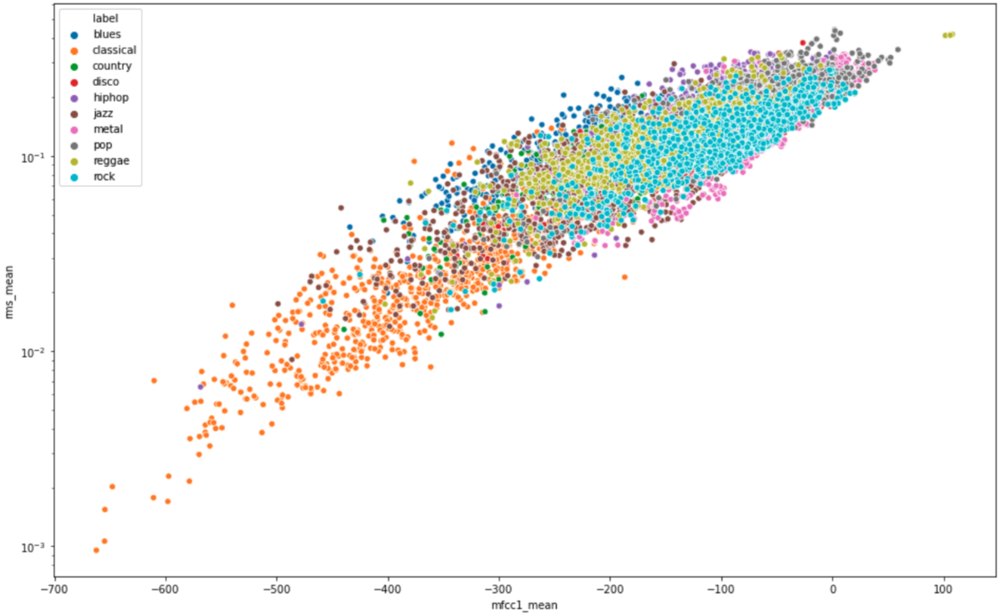

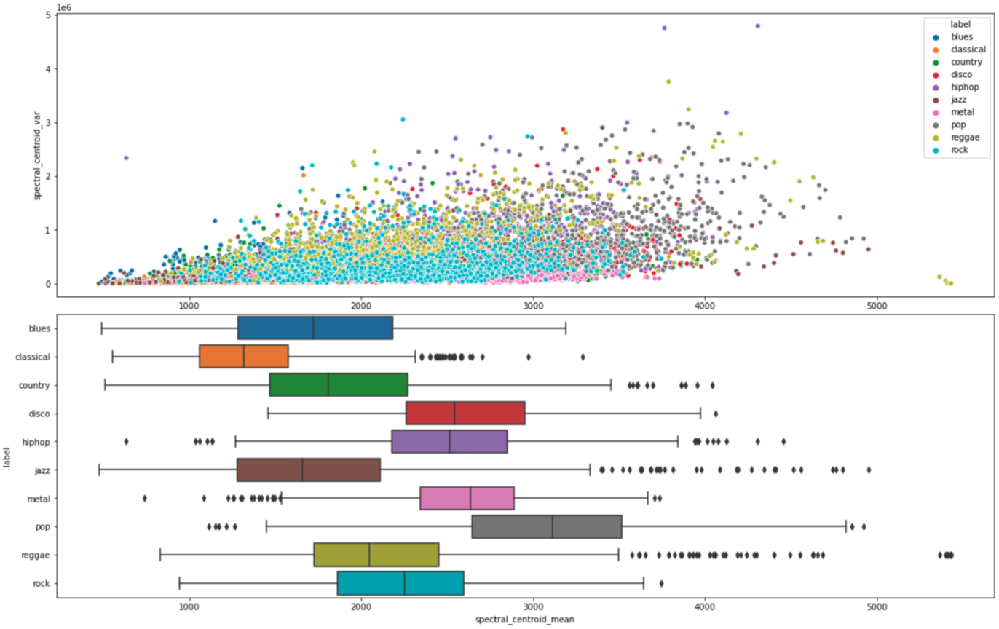

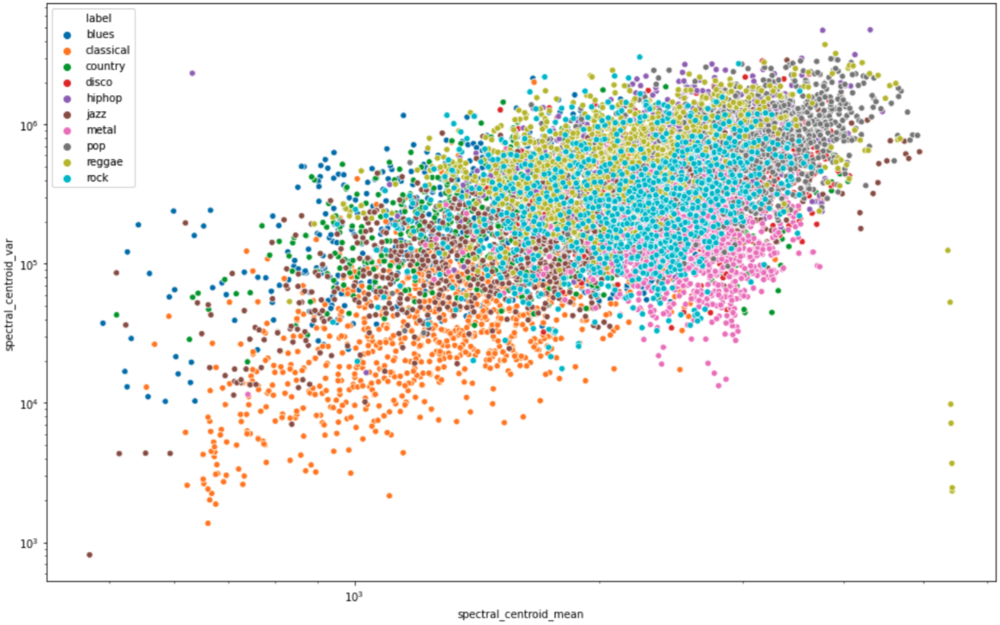

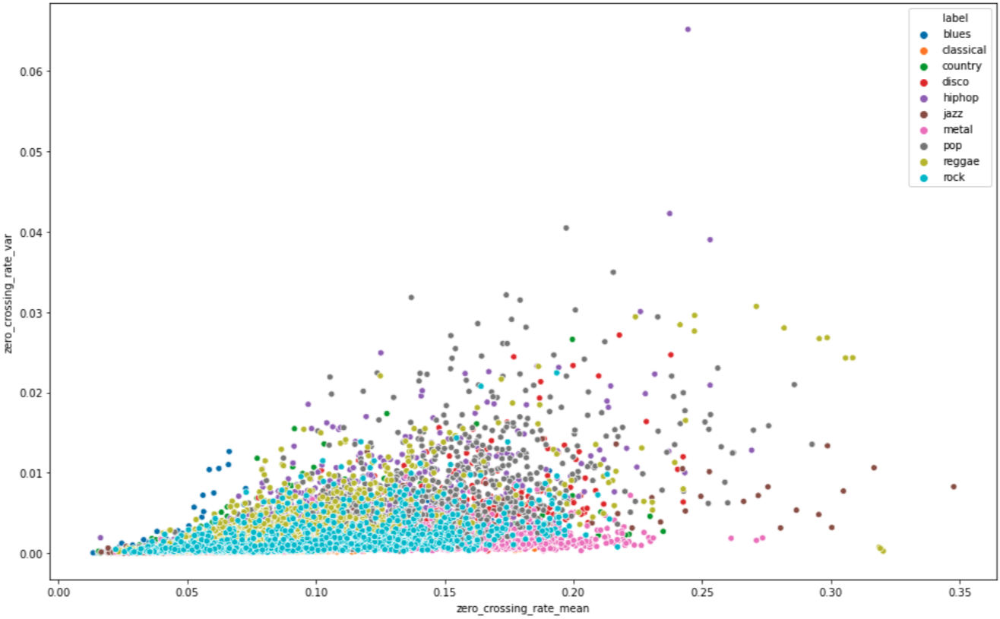

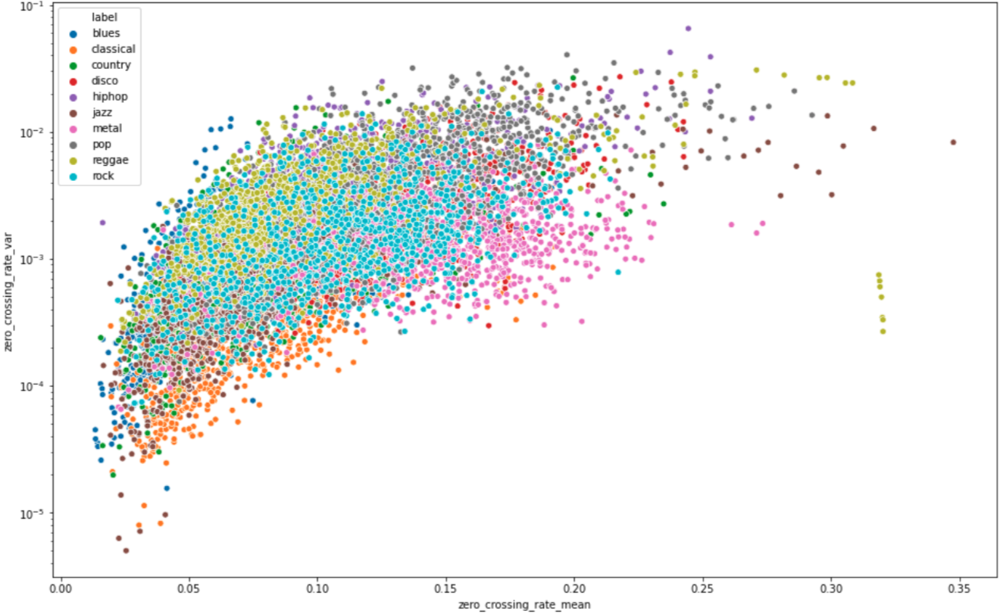

##### Clustering:

Preprocessing:
1. Set target variable = 'label' (ie genre) and features as remaining features
2. Standardisation using StandardScaler()

KMeans Clustering:
1. Instantiate with n_clusters=30
2. Fit on features

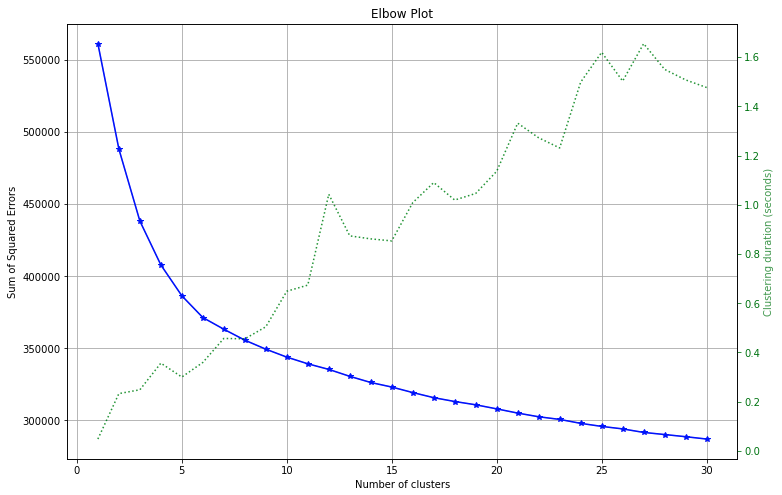

- It was expected to find a distinct "elbow" at 10 clusters (for the 10 different classes).
- However, it seems more prominent at 5-6(?) clusters.

[(back to top)](#back_to_top)

<a id='modelling_audio'></a>

## 3. Modelling on Audio Features
---

Preprocessing steps to prepare the dataset for modelling:
1. Set target ('label' column i.e. the genre), set features.
2. Train test split, with a test size of 0.2, and stratify on the target to ensure equal split between train and test sets.
3. Standardisation using StandardScaler().
4. Calculate baseline of target (for reference and to compare model performance against).

```python
# set target and features
X = df_3.copy()
y = X.pop('label')

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=1)

# standardscaler
scaler = StandardScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X.columns, index=X_train.index)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X.columns, index=X_test.index)

# Baseline
y_test.value_counts(normalize=True)
```

Baseline: ~0.10<br>
The target is (fairly) balanced within the test set.<br>
For this reason, the **success metric will be on accuracy**.

| Genre | Ratio |
| :-: | :-: |
| jazz | 0.101523 |
| blues |        0.101523 |
| classical |    0.101523 |
| country |      0.101015 |
| rock |         0.100508 |
| disco |        0.100508 |
| reggae |       0.100000 |
| hiphop |       0.099492 |
| pop |          0.099492 |
| metal |        0.094416 |


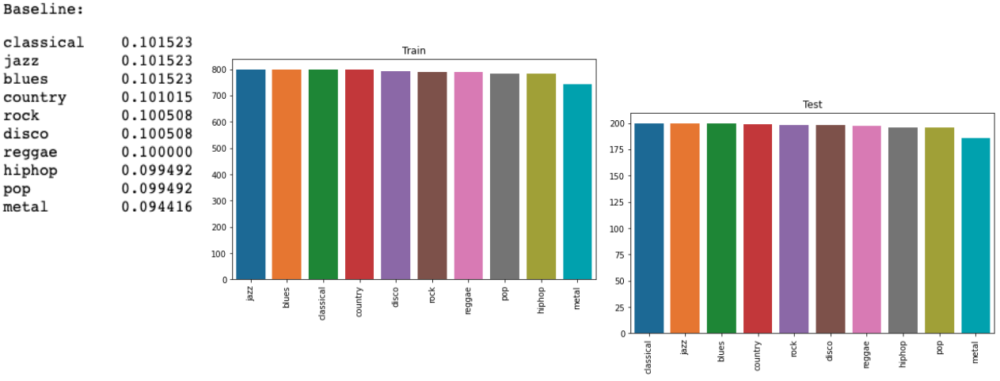

#### Logistic Regression

As a benchmark, a Logistic Regression model with no regularisation was fit first. [Link to notebook](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_2_logreg.ipynb).

Resulting accuracy scores:

| | Accuracy |
| :- | :-: |
| Training set |	 0.7284499174812746
| Cross validated mean (5 fold) |	 0.7064845701393925
| Test set |	 0.7121827411167513
<br>

**Model coefficients for Logistic Regression with ridge regularisation:**

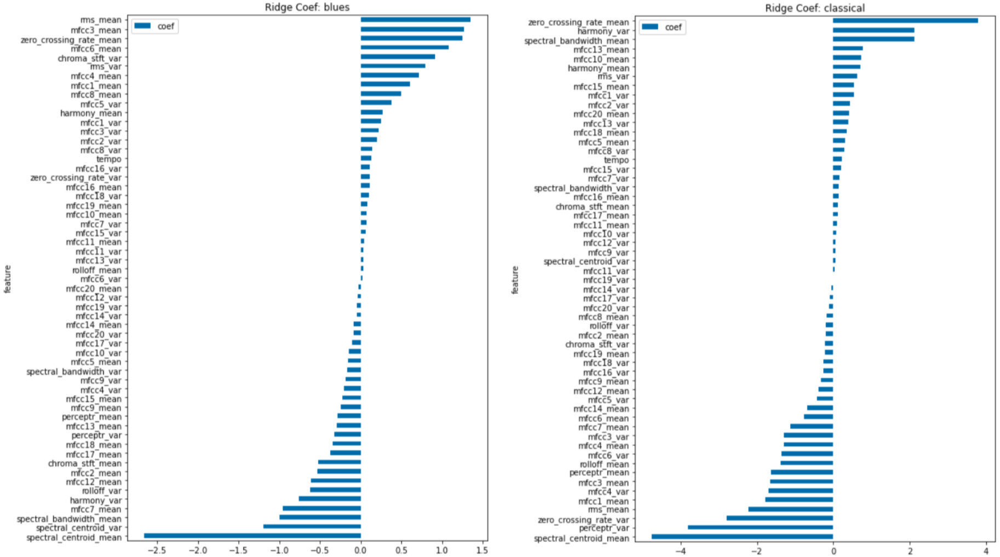

**Model coefficients absolute mean (across 10 different genres), in descending order:**

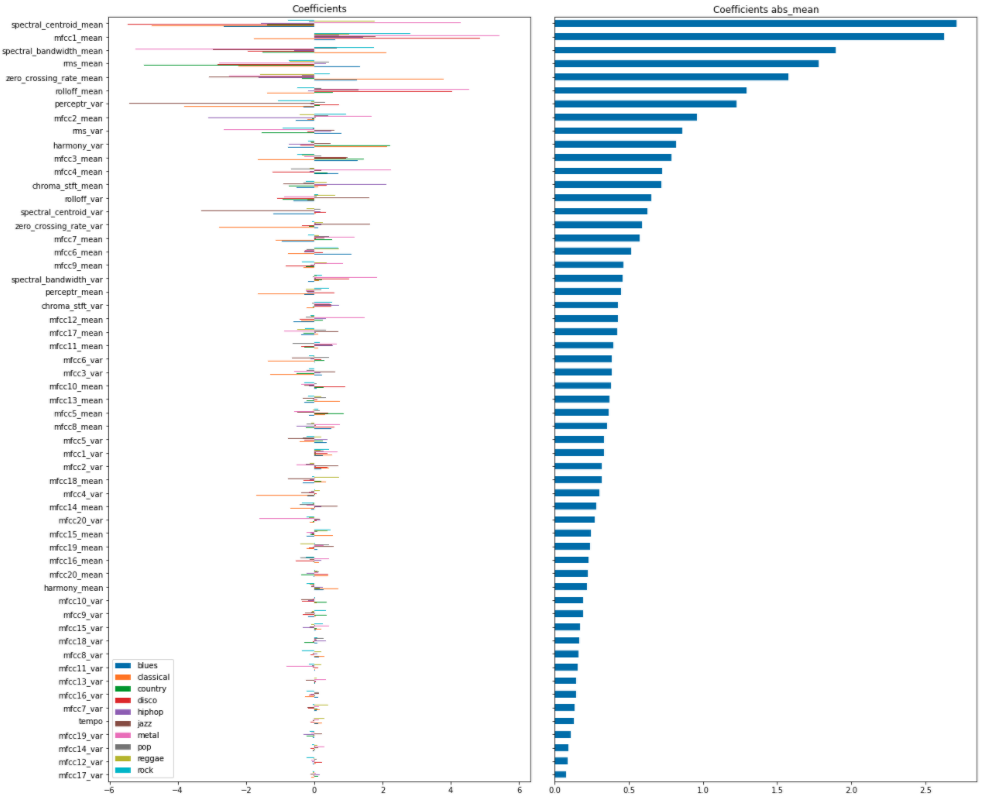

**Scores summary for other models fit (including grid searches to optimise hyperparameters):**

|Model |	Parameters |	Train Score |	Test Score |	CV Mean |
| :- | :- | :-: | :-: | :-: |   
| Logistic Regression	| Default |	0.7284 |	0.7122 |	0.7065 |
| Logistic Regression |	Ridge regularisation |	0.7304 |	0.7102 |	0.7091 |
| Logistic Regression |	Lasso regularisation |	0.7309 |	0.7152 |	0.7084 |
| DecisionTreeClassifier |	Default |	1.0000 |	0.6609 |	0.6227 |
| DecisionTreeClassifier | Gridsearch parameters:	{'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 14, 'splitter': 'best'} |	0.9839 |	0.6558 |	0.6521 |
| DecisionTreeClassifier | Bagging |		1.0000 |	0.8345 |	0.8338 |
| RandomForestClassifier | Gridsearch: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 29, 'n_estimators': 1500} |	1.0000 |	0.8746 |	0.8666 |
| KNearestNeighbor |	n_neighbors: 3 |	0.9562 |	0.8854 |	0.8890 |
| KNearestNeighbor |	Gridsearch: {'algorithm': 'auto', 'n_neighbors': 1, 'weights': 'uniform'} |	1.0000 |	0.9036 |	0.8955 |
| LightGBM |	Gridsearch: "num_leaves=10, max_depth=10, learning_rate=0.1, n_estimators=1000, class_weight='balanced'" |	1.0000 | 0.9132 | 0.9087 |

- We can see signs of overfitting, with perfect training scores.
- But as the cross validated mean (CV mean) is also performing well, it can be assumed that these models are also generalising well.
- LightGBM resulted in the highest cross validated mean accuracy, with a score of ~0.91

**Links to notebooks:**

- [Logistic Regression](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_2_logreg.ipynb)
- [Decision Tree Classifer](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_3_dtc.ipynb)
- [Random Forest Classifier](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_4_ens_rfc.ipynb)
- [KNN](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_5_knn.ipynb)
- [LightGBM](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_6_lightgbm.ipynb)

---
**Confusion matrix (LightGBM):**
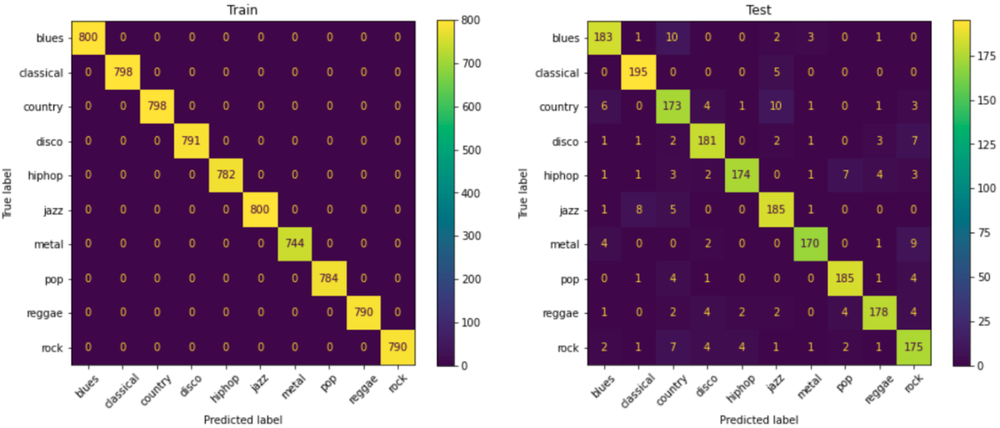


---
**Classification report (LightGBM):**
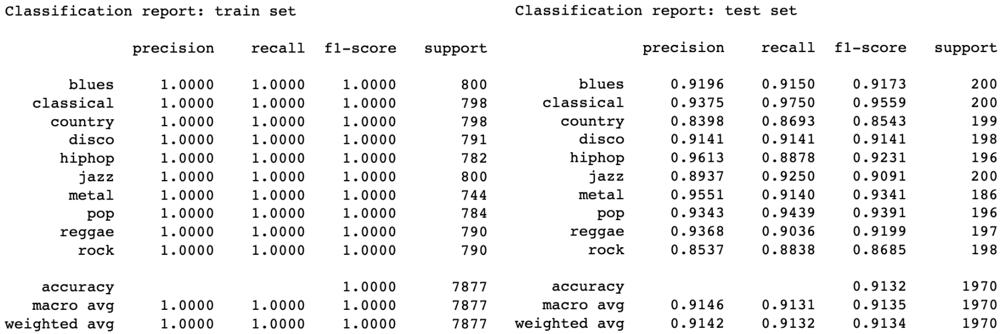

<br><br>
- As can be seen, the model has severely overfit on the training data, resulting in a perfect score.
- However, the cross validated mean (5 fold on training set) and test scores both performed relatively well, at 0.9087 and 0.9132 respectively.
<br><br>

---
**Precision Recall and ROC curve -test set- (LightGBM):**
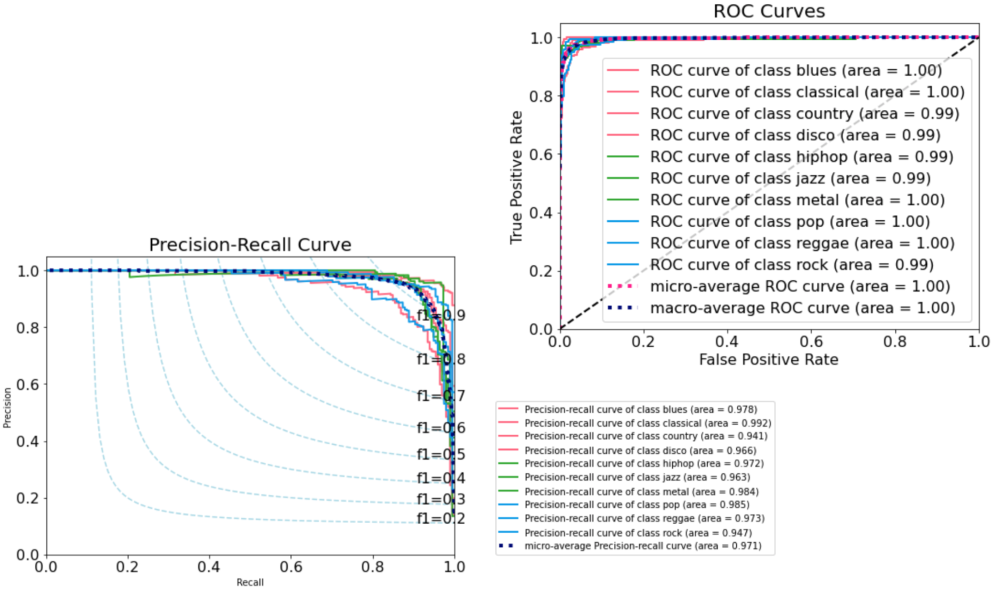


---
**Feature Importance (LightGBM):**
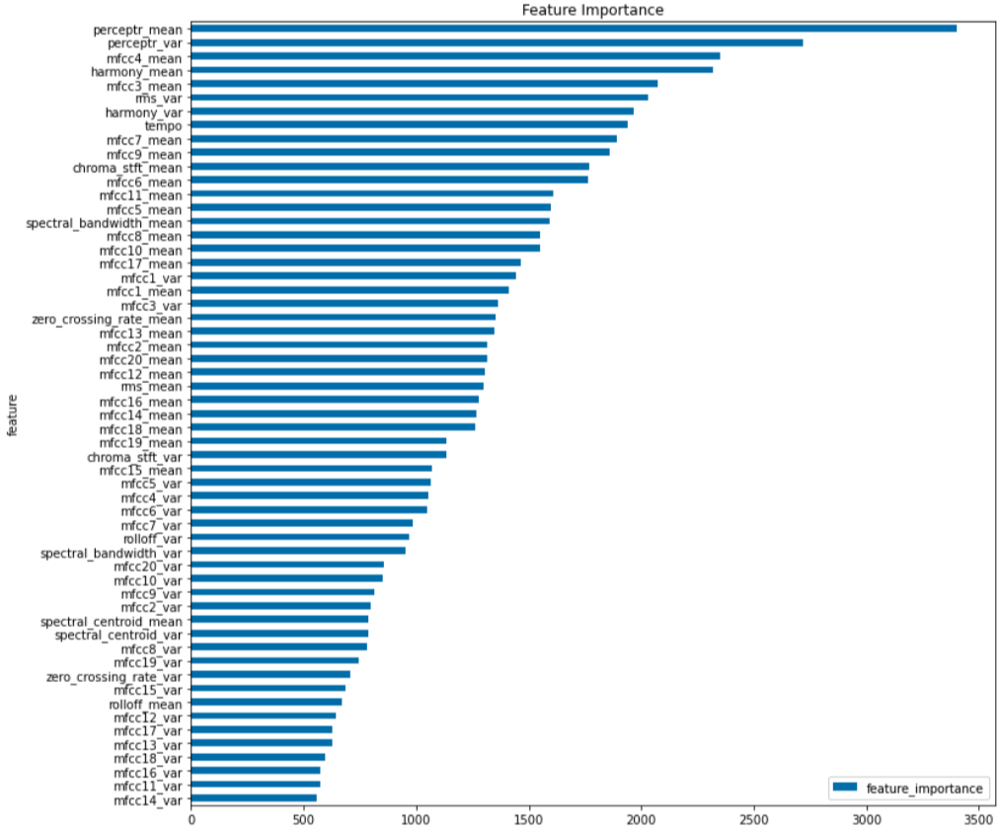

- The feature importances drawn from the resulting LightGBM model shows some interesting points:
    - The order of the MFCC is inversely proportional to it's feature importance within the model. 
    - Lower order MFCC's tend to have a higher 'importance', and higher orders lower importance.
    - The mean MFCC tends to play a more important role for the model than their variance counterparts.

---
**Visual comparison of prediction results (LightGBM) and Logistic Regression on an example feature plane:**
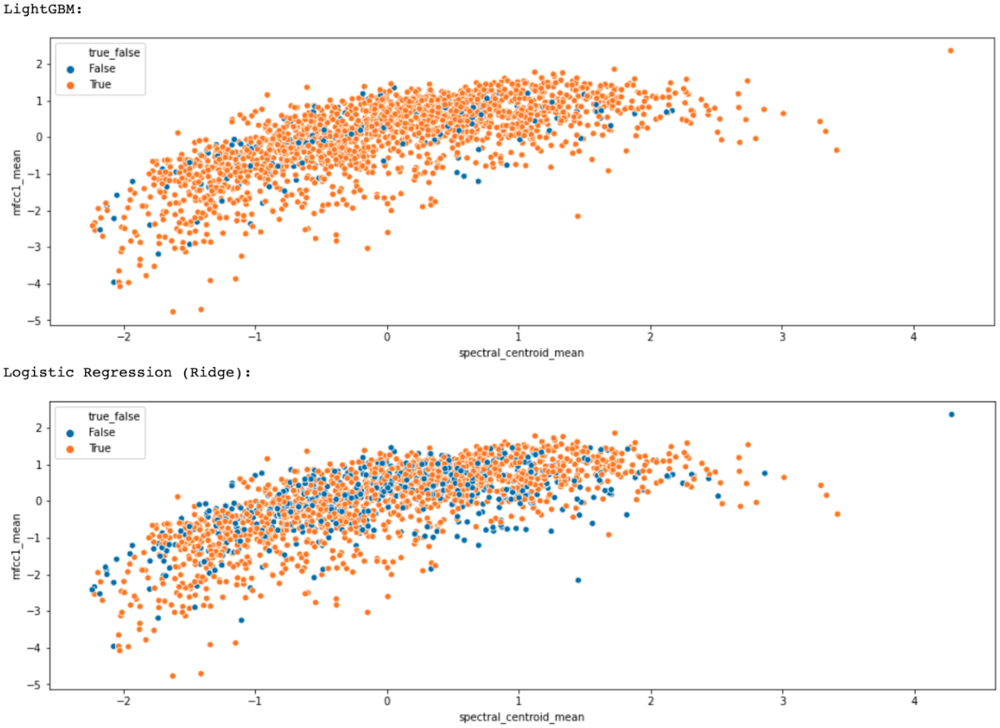

- The above is a visual representation of the predictions made by LightGBM and Logistic Regression on an example feature plane (MFCC 1 mean against spectral centroid mean).
    - Orange: correct prediction
    - Blue: incorrect prediction
- It can be seen clearly that LightGBM performs significantly better than Logistic Regression.


### Appendix: Scores graphs for DecisionTreeClassifier and kNN
---
**Scores of DecisionTreeClassifier model at varying depths:**
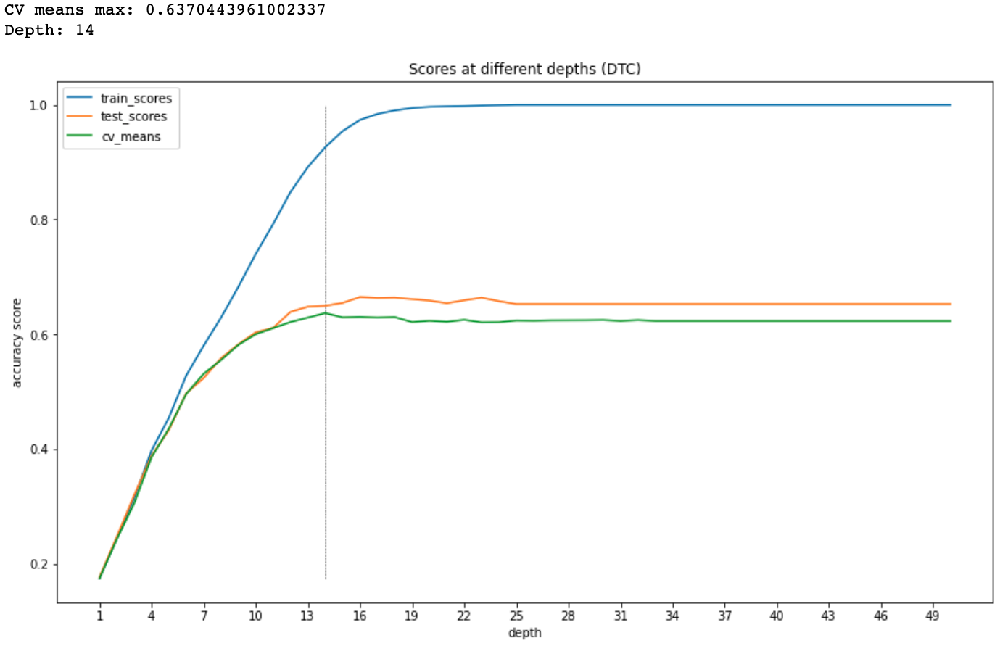

- As can be seen, the scores do tend to their maximum achievable values (for the given dataset and hyperparameters), after a certain depth.
- Training scores reach perfect score of 1.0 after approximately 20-22 depth.
- Cross validated mean is at a maximum of ~0.637 at depth 14.


---
**Scores of kNN model at varying number of neighbors:**

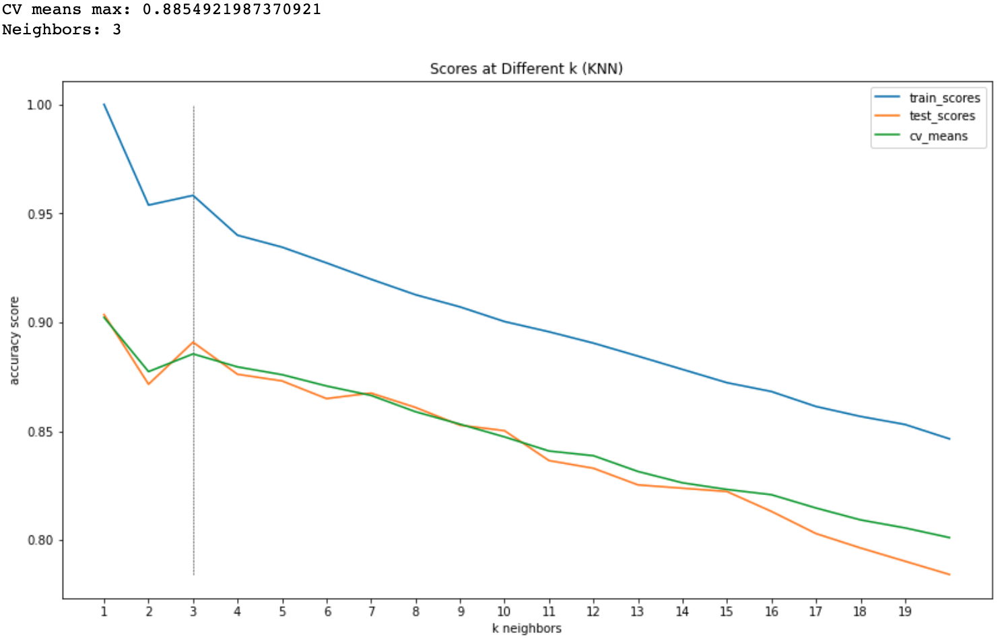

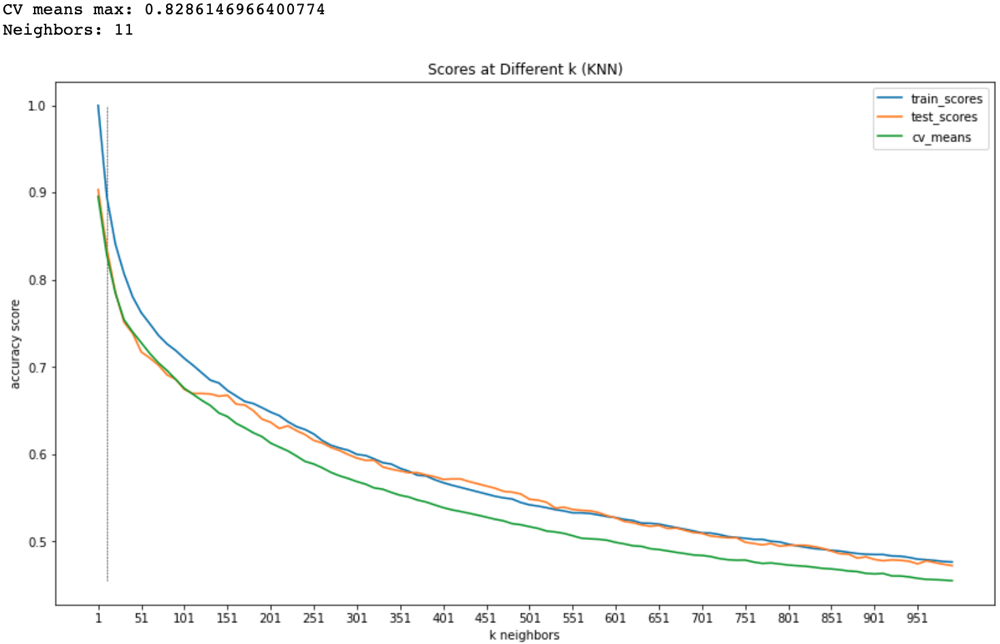

- Conversely, scores of kNN deteriorates steadily with increasing number of neighbors (for each vote).
- The two charts above show both low number, as well as higher number of neighbors, to illustrate this degradation of accuracy.

[(back to top)](#back_to_top)

<a id='modelling_spectrograms'></a>

## 4. Modelling on Mel Spectrograms
---

[Link to notebook 1: Logistic Regression, SVC, LightGBM, DTC, KNN](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_images_1_logreg_svc_lightgbm_dtc_knn.ipynb)<br>
[Link to notebook 2: RFC](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_images_2_rfc.ipynb)<br>

**Process flow to generate mel spectrograms:**<br>
1. Read in WAV files (100 WAV files per genre x 10 genres)
2. Generate Mel spectrograms (using Librosa)
3. Save spectrogram images to disk

```python
# genres list
genres = ['hiphop', 'disco', 'metal', 'reggae', 'jazz', 'rock', 'blues', 'pop', 'classical', 'country']

# generate filenumbers (eg '00001.wav')
numrange = range(0,100)
filenums = []

for num in numrange:
    if num < 10:
        filenums.append('0000'+str(num)+'.wav')
    else:
        filenums.append('000'+str(num)+'.wav')

# iterate through wav files, process spectrograms with librosa, save images to another directory: lib_specgrams
for genre in genres:
    for num in filenums:
        filename_wav = genre+'.'+num 
        
        filepath = f'../gtzan/Data/genres_original/{genre}/{filename_wav}'
        print(f'{genre}{num[:-4]}_spec.png')
        
        try:        
            # loading audio
            y, sr = librosa.load(filepath)

            #Mel Spectogram
            S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)

            # convert to log scale (dB), using peak power (max) as reference
            log_S = librosa.power_to_db(S, ref=np.max)

            plt.figure(figsize=(12,4))

            # display spectogram on a mel scale
            # sample rate and hop length parameters used to render time axis
            librosa.display.specshow(log_S, sr=sr)#, x_axis='time', y_axis='mel')
            
            # write to disk
            plt.savefig(f'../gtzan/lib_images/lib_specgrams/{genre}{num[:-4]}_spec.png')

        except:
            continue
            
```

**Generated mel spectrogram examples for each genre:**

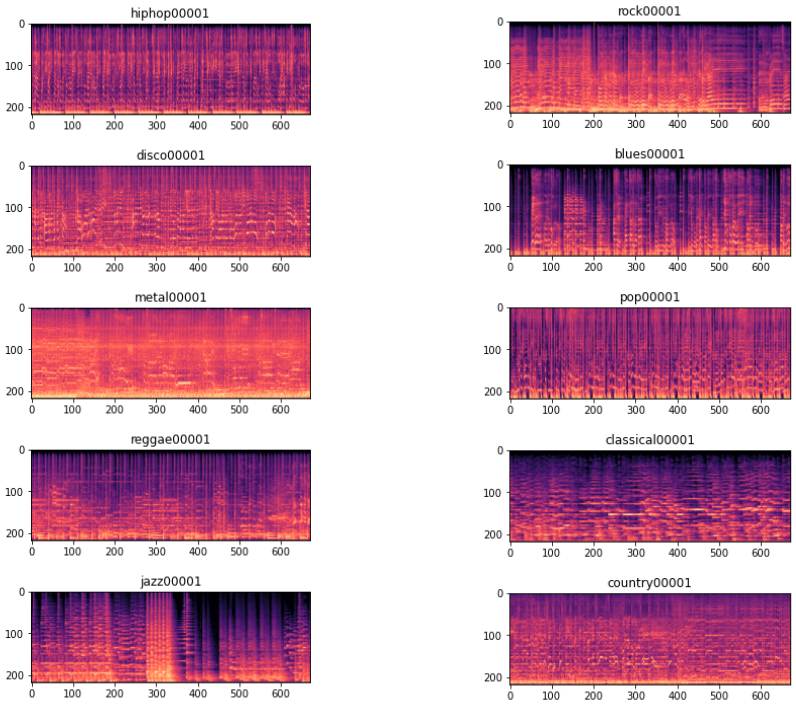

---

4. Read in spectrogram images, and populate dictionary (images represented as 3d numpy arrays)
5. Crop white borders

```python
# populate images_dict with filename and accompanying np array, representing the associated image
images_dict = {}

# cycle through spectrograms, add to images_dict
for genre in genres:
    for num in filenums:
        filepath = f'../gtzan/lib_images/lib_specgrams/{genre}{num[:-4]}_spec.png'        
        
        try:
            images_dict[f'{genre}{num[:-4]}'] = io.imread(filepath)
        except:
            continue

# crop white borders out of each image and "standardize"
cropped_dict = {}

for genre in genres:
    for num in filenums:
        try: 
            cropped_dict[genre+num[:-4]] = images_dict[genre+num[:-4]][35:253,108:779] / 255
        except:
            continue
```

---

**Flatten 3D arrays to 1D, and Dimension Reduction (PCA) to reduce features from 585112 to 783:**
1. Flatten/unravel 3D arrays (RGB images) to 1D

```python

# flatten all 3D arrays (images) to 1D
flat_dict = {}

for key in cropped_dict:
#     print(key+'_flat')
    flat_dict[key+'_flat'] = cropped_dict[key].ravel() # .ravel(order='F')
    
df_flat = pd.DataFrame(flat_dict).T

# add column for label ('genre'), then slice filenumber off
df_flat['genre'] = df_flat.index
df_flat['genre'] = df_flat['genre'].apply(lambda x: x[:-10])
```

---

2. Decompose dimensions from 585112 columns (number of pixels) down to 783 columns using Principle Component Analysis.<br>Maintaining ~100% (0.99999999) of explained variance ratio.

```python
# set target and features
X = df_flat.copy()
y = X.pop('genre')

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, 
                                                    random_state=1, shuffle=True)

# PCA (n_components: 0.99999999)
n_components = 0.99999999
pca = PCA(n_components=n_components, random_state=1, svd_solver='full')
X_train_pc = pd.DataFrame(pca.fit_transform(X_train), 
                         columns=[f'PC_{i+1}' for i in range(pca.n_components_)], index=X_train.index)

X_test_pc = pd.DataFrame(pca.transform(X_test), 
                         columns=[f'PC_{i+1}' for i in range(pca.n_components_)], index=X_test.index)
```

---

**Explained Variance Ratio:** 
- 783 features remaining after dimensionality reduction (PCA), while maintaining 0.99999999 explained variance.<br><br>
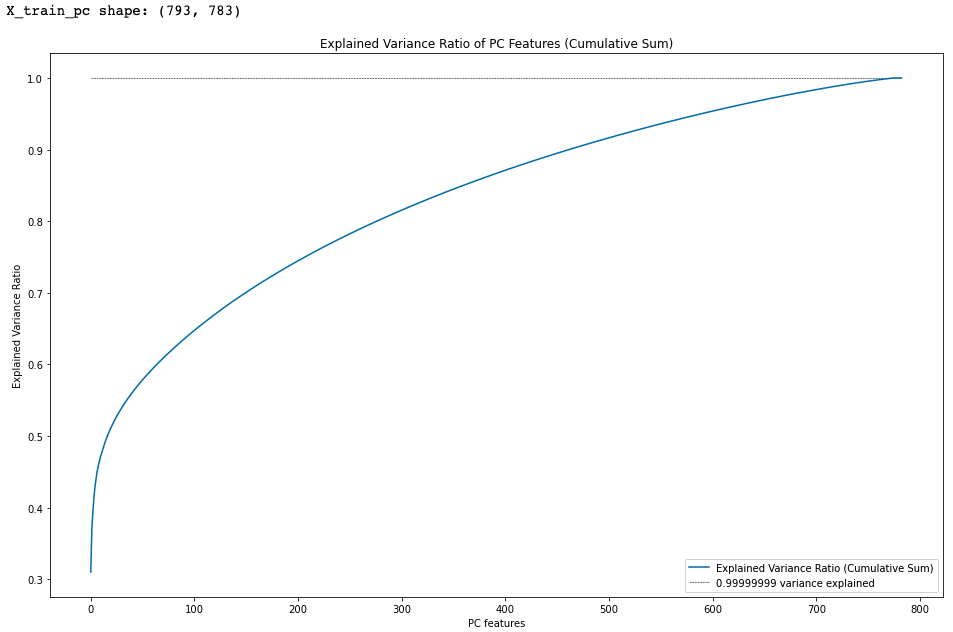

**Scores summary for models fit:**

|Model | Train Score | Test Score | CV Mean |
| :- | :-: | :-: | :-: |
| LogisticRegression |		0.9987 |	0.5700 |	0.5695 |
| DTC |		1.0000 |	0.3150 |	0.3129 |
| RFC |		1.0000 |	0.4150 |	0.3480 |
| SVM Classifier |		0.9987 |	0.365 |	0.3367 |

- The scores were lower than hoped. Perhaps explained by the elementary approach of unravelling pixels and using these as the feature matrix.

**HOG Features:**
- A common method used in image classification is to use HOG features (Histogram of Oriented Gradients).
- This essentially measures the gradient of pixel values across a pixel square. 
- In other words, HOG features shows "edges" of an image (where pixel values will change over a short distance).

[Link to notebook: HOG features](https://github.com/johakaishi/music_genre_classification_gtzan/blob/master/gtzan_images_3_hog_demonstration.ipynb)

**An example showing HOG visualisation on a panda:**
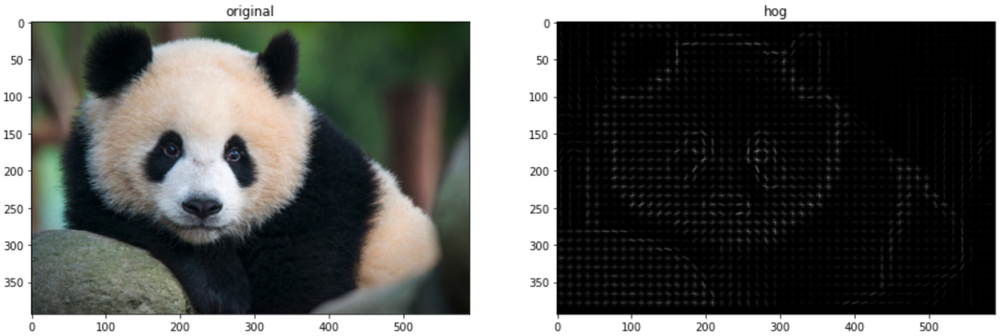

**And the equivalent for a mel spectrogram:**
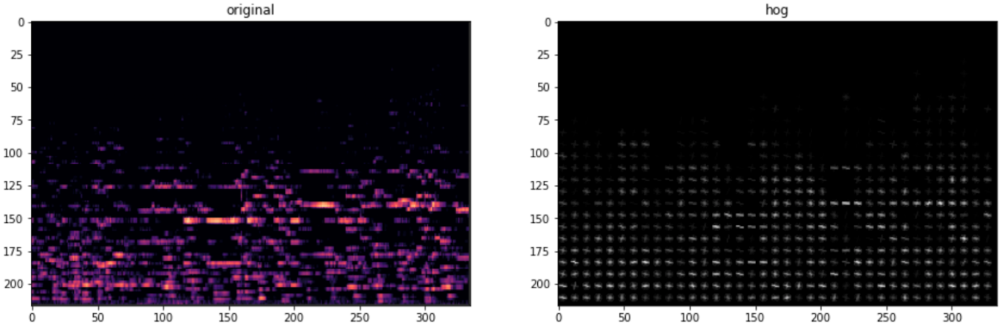

**Scores Summary:**

| Model | Parameters | Train Score | Test Score | CV Mean Score | Comments |
| :- | :- | :-: | :-: | :-: | :- |
| LogisticRegression |	default |	0.9987 |	0.6350 |	0.5682 |	HOG (9x9) PC |
| Logistic Regression |	Ridge |	0.9987 |	0.5250 |	0.4906 |	HOG (9x9) PC |
| LogisticRegression |	default |	0.9987 |	0.6500 |	**0.5945** |	HOG (12x12) PC |
| LightGBM |	default |	1.0000 |	0.5450 |	0.4668 |	HOG (12x12) PC |
| LightGBM |	Gridsearch: {'class_weight': None, 'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 1000, 'num_leaves': 50} |	1.0000 |	0.5300 |	0.4793 |	HOG (12x12) PC |

- The maximum cross validated mean accuracy achieved was 0.5945, with Logistic Regression.
- Increasing the pixel square size (from 9x9 pixels to 12x12 pixels) seemed to improve model performance slightly, but not anywhere near the accuracy obtained from modelling on the audio signal features.

[(back to top)](#back_to_top)

<a id='conclusions'></a>

## 5. Conclusions & Future Expansion 
---

#### Conclusions
- Final overall best accuracy achieved by LightGBM on audio signal features, with a score of ~0.91 (5 fold cross validated mean).<br><br>
- Modelling on mel spectrograms did not result in better performance in the end.

#### Future Expansion
- Implement polynomial features on the audio signal features to improve on Logistic Regression score. 
    - The fact that kNN performed much better than logistic regression might be explained by the fact that logistic regression relies on straight line decision boundaries, while kNN is instance based.
    - Generating polynomials from the original features may therefore assist in the performance of logistic regression modelling.<br><br>

- It would be interesting to explore which genres were misclassified the most, and to investigate if there are any patterns within the misclassifications.<br><br>
- The dataset for mel-spectrogram classification was too small (~1000 images available for the whole dataset). Ideally we would need more.<br><br>
- Use of Convolutional Neural Networks on the image classification might be better suited than the method applied above of simply 'unravelling pixels'.<br><br>
- Use of both audio signal features and the mel-spectrogram images in conjunction as the features might also improve on accuracy scores.

[(back to top)](#back_to_top)